In [27]:

import pandas as pd
import dask.dataframe as dd
import geopandas as gpd
import numpy as np

#measure libraries
from haversine import haversine, Unit

# visualization libraries
import matplotlib.pyplot as plt
from keplergl import KeplerGl
from mpl_toolkits.basemap import Basemap
from shapely import wkt
import contextily as cx
from shapely.geometry import Point, Polygon
import adjustText as aT

In [2]:
pd.set_option('display.max_rows', None)

#### clean dataframes

In [3]:
#import csv files
df_buildings = dd.read_csv('data/moz_buildings.csv') #given the size of buildings.csv we will use a dask dataframe to speed up the process
df_health = pd.read_csv('data/moz_health_buildings.csv') #read as pandas dataframe

#import geojson file as geopandas of mozambique administrative boundaries
# from geoboundaries.org
df_boundaries_admin_1 = gpd.read_file('data/moz_boundaries_admin_1.geojson')
df_boundaries_admin_2 = gpd.read_file('data/moz_boundaries_admin_2.geojson')

In [4]:
df_boundaries_admin_2

,shapeName,shapeISO,shapeID,shapeGroup,shapeType,geometry
0,Alto Molocue,,85939544B11323222409894,MOZ,ADM2,"POLYGON ((37.59634 -15.19208, 37.59621 -15.192..."
1,Ancuabe,,85939544B54013965767211,MOZ,ADM2,"POLYGON ((40.02725 -12.84019, 40.02698 -12.837..."
2,Angoche,,85939544B5798795803729,MOZ,ADM2,"MULTIPOLYGON (((39.79597 -16.35094, 39.79597 -..."
3,Angonia,,85939544B22039143391399,MOZ,ADM2,"POLYGON ((34.51998 -14.68475, 34.51995 -14.684..."
4,Balama,,85939544B76331099074283,MOZ,ADM2,"POLYGON ((38.70706 -13.48413, 38.69236 -13.474..."
5,Barue,,85939544B86120140572835,MOZ,ADM2,"POLYGON ((33.35801 -17.52032, 33.35790 -17.519..."
6,Bilene,,85939544B82596701681562,MOZ,ADM2,"POLYGON ((33.36820 -24.78411, 33.36752 -24.783..."
7,Boane,,85939544B80001200844665,MOZ,ADM2,"POLYGON ((32.47304 -25.99189, 32.47251 -25.991..."
8,Buzi,,85939544B64299402378128,MOZ,ADM2,"MULTIPOLYGON (((34.66028 -20.39550, 34.66045 -..."
9,Cahora Bassa,,85939544B25670976953957,MOZ,ADM2,"POLYGON ((32.98851 -15.58526, 32.98823 -15.585..."


In [5]:
# drop unnecessary columns from boundaries geopandas
df_boundaries_admin_1_clean = df_boundaries_admin_1[['shapeName', 'geometry']] #admin_1
df_boundaries_admin_2_clean = df_boundaries_admin_2[['shapeName', 'geometry']] #admin_2
#rename columns
df_boundaries_admin_1_final = df_boundaries_admin_1_clean.rename(columns={'shapeName': 'region'}) #admin_1
df_boundaries_admin_2_final = df_boundaries_admin_2_clean.rename(columns={'shapeName': 'region'}) #admin_2

What type of facilities are there

In [35]:
df_health_na['amenity'].unique()

array(['clinic', 'hospital', 'pharmacy', 'doctors', 'dentist'],
      dtype=object)

In [6]:
#data cleaning of health facilities data
df_health_variables_used = df_health[['X', 'Y', 'amenity']] #keep only necessary columns
df_health_renamed_cols = df_health_variables_used.rename(columns={'X':'longitude', 'Y':'latitude'}) #rename columns for clarity
df_health_na = df_health_renamed_cols.dropna() #drop nan rows
df_health_na.reset_index(inplace=True) # reset index

In [7]:
#data cleaning of buildings data
# keep only rows that are at least 8'% confident of identifying a building
df_buildings_high_confidence = df_buildings[df_buildings['confidence'] >= 0.8]
#select only necessary columns
df_buildings_used_variables = df_buildings_high_confidence[['latitude', 'longitude','area_in_meters', 'geometry']]

In [8]:
#turn into pandas df now data we have done all alterations
df_buildings_pd = df_buildings_used_variables.compute()

In [9]:
#create a sample dataframe of buildings data for future computations
df_buildings_sample =df_buildings_used_variables.sample(frac=0.001).compute() #sample of 0.1% of original df and .compute() turns it into pandas dataframe
df_buildings_sample.reset_index(inplace=True)

In [10]:
df_buildings_sample

,index,latitude,longitude,area_in_meters,geometry
0,121953,-14.284499,38.240407,38.6354,"POLYGON((38.2404415484143 -14.2844773257804, 3..."
1,57601,-15.734063,39.999192,46.6833,"POLYGON((39.9992260666658 -15.7340916112922, 3..."
2,79251,-15.926655,40.064331,38.4577,"POLYGON((40.0643594454611 -15.9266836194785, 4..."
3,218028,-13.758952,39.727746,76.2830,"POLYGON((39.7278008294122 -13.7589693366771, 3..."
4,227805,-13.718450,39.819783,95.6284,"POLYGON((39.8198072160781 -13.718511798787, 39..."
5,26089,-15.198155,40.231959,52.3488,"POLYGON((40.2319989054997 -15.1981805630518, 4..."
6,80881,-15.872234,40.184930,36.7542,"POLYGON((40.1849642164465 -15.8722139705305, 4..."
7,4000,-10.409146,40.306674,72.8739,"POLYGON((40.3067284429895 -10.4091394913275, 4..."
8,109959,-14.369954,37.830470,39.2001,"POLYGON((37.8305042147812 -14.3699304431469, 3..."
9,68740,-16.010911,40.121217,20.0964,"POLYGON((40.1212456180804 -16.0109183925949, 4..."


#### Plot population density and health facilities to get a picture of density

In [11]:
#coordinates for buildings
long_build = df_buildings_pd['longitude']
lat_buid = df_buildings_pd['latitude']
area_build = df_buildings_pd['area_in_meters']

#coordinates for health facilities
long_hosp = df_health_na['longitude']
lat_hosp = df_health_na['latitude']

C:\Users\Utilizador\AppData\Roaming\Python\Python39\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


http://server.arcgisonline.com/ArcGIS/rest/services/World_Shaded_Relief/MapServer/export?bbox=29.999999999999996,-27.0,41.0,-10.0&bboxSR=4127&imageSR=4127&size=3500,5409&dpi=96&format=png32&transparent=true&f=image


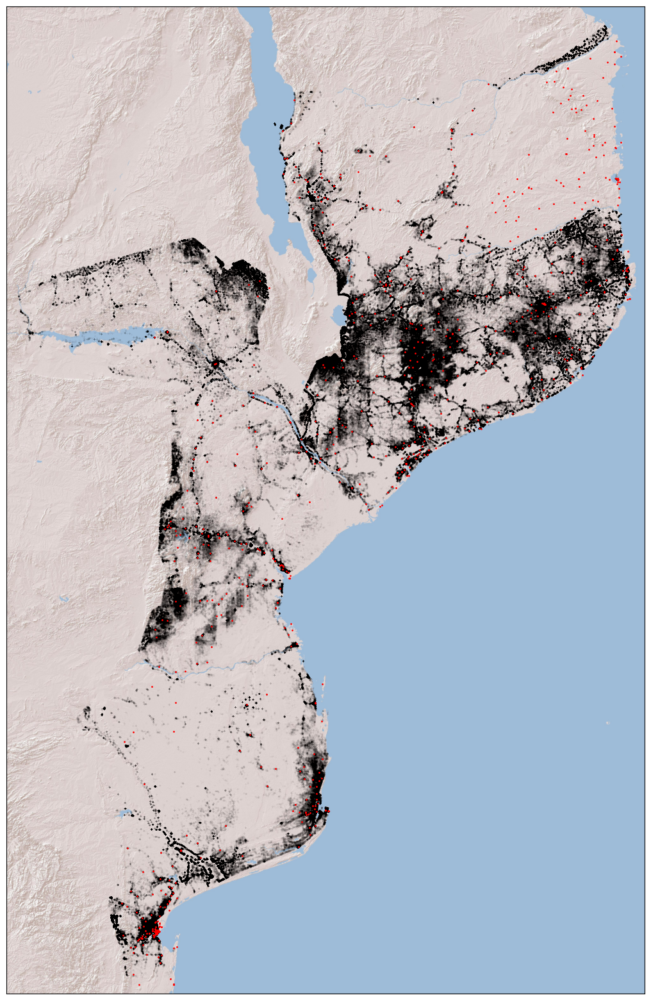

In [12]:
plt.figure(figsize=(20, 20))

#basemap dimensions
m = Basemap(
    projection='merc',
    resolution='h', 
    llcrnrlat=-27.0, # Lower-left corner latitude
    urcrnrlat=-10.0, # Upper-right corner latitude
    llcrnrlon=30.0,  # Lower-left corner longitude
    urcrnrlon=41.0,   # Upper-right corner longitude
    epsg = 4127 
           )
#type of base map
m.arcgisimage(service='World_Shaded_Relief', xpixels = 3500, verbose= True)




#add buildings
m.scatter(long_build, lat_buid, latlon=True,
          s=0.0002, alpha=0.5, color='black')

#add health facilities
m.scatter(long_hosp, lat_hosp, latlon=True,
          s=1, alpha=1, color='red')

plt.show()

#### Use Kepler.gl for a more interactive perspective

In [13]:
df_buildings_kepler = df_buildings_sample.rename(columns={'latitude': 'latitude_b', 'longitude':'longitude_b'})
df_health_kepler = df_health_na.rename(columns={'latitude': 'latitude_h', 'longitude':'longitude_h'})

In [14]:
df_kepler = pd.concat([df_buildings_kepler, df_health_kepler], axis=1)

In [15]:
kepler_map = KeplerGl(height=500, data={'buildings': df_kepler})

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


C:\Users\Utilizador\anaconda3\lib\site-packages\keplergl\keplergl.py:22: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  return df.to_dict('split')
C:\Users\Utilizador\anaconda3\lib\site-packages\jupyter_client\session.py:718: UserWarning: Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant
  content = self.pack(content)


In [16]:
kepler_map

KeplerGl(data={'buildings':        index  latitude_b  longitude_b  area_in_meters  \
0     121953  -14.284499 …

#### We can also use simple spatial fotography to get a sense of population density

In [17]:
nightlights = cx.providers.NASAGIBS.ViirsEarthAtNight2012
mozambique = cx.Place("Mozambique", source=nightlights)

<Axes: title={'center': 'Moçambique'}, xlabel='X', ylabel='Y'>

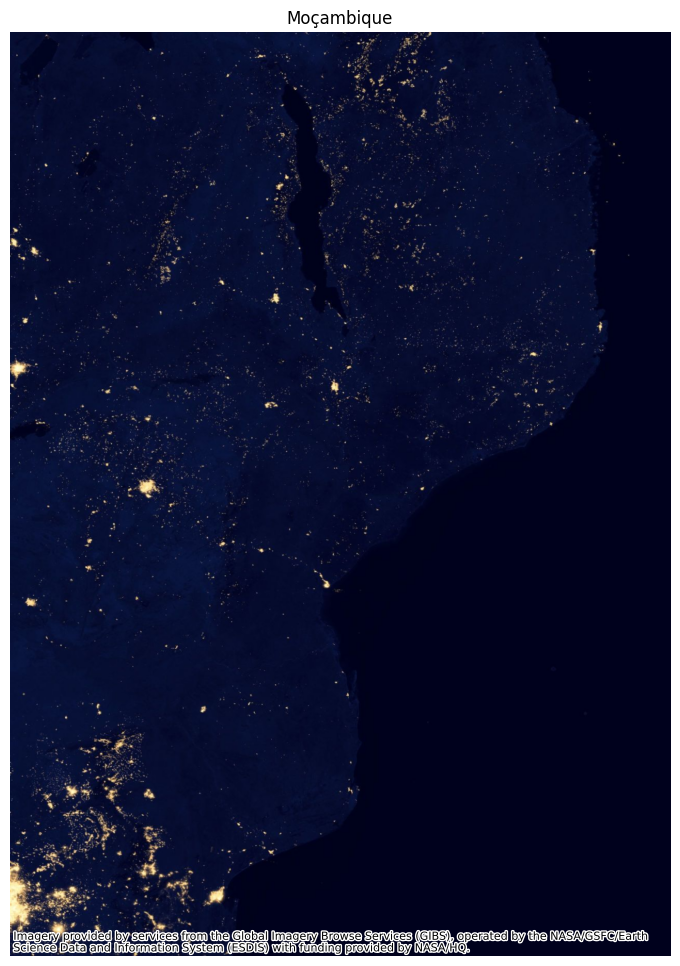

In [18]:
mozambique.plot()

## Now that we have an intial idea of how our variables are distributed, we can study things with a bit more granularity. Namely in terms of administrative regions

Compute distances between buildings and health facilities

In [30]:
#compute average distance between buildings and health facilities
#haversine distance computes distance for geographical data, taking into account the degrees at a given latitude.

distances = np.zeros(shape=(len(df_buildings_sample), len(df_health_na))) # np array to store distances

for i in range(len(df_buildings_sample)):
    for j in range(len(df_health_na)):
        distances[i, j] = haversine((df_buildings_sample['latitude'][i], df_buildings_sample['longitude'][i]), 
                       (df_health_na['latitude'][j], df_health_na['longitude'][j]))

In [31]:
#compute closest health facility to each building
min_distance = distances.min(axis=1)

#compute average health facility distance to each building for the whole country
mean_distance = min_distance.mean()

In [33]:
mean_distance

13.163805076475647

On average, people are away from any type of health facility

#### Add average distance but for each administrative region

In [32]:
#add distances to sample df_buildings_sample
df_buildings_sample['distance_closest_health_facility'] = min_distance
#drop index column
df_buildings_sample.drop('index', axis=1)


#convert df_buildings_sample into geodataframe
df_buildings_sample_gpd = gpd.GeoDataFrame(df_buildings_sample, geometry=df_buildings_sample['geometry'].apply(wkt.loads))

# make sure the coordinates are the same
df_boundaries_admin_1_final.crs = df_buildings_sample_gpd.crs

#performe spatial join of dfs
df_building_per_admin_1 = gpd.sjoin(df_buildings_sample_gpd, df_boundaries_admin_1_final, how='left')

#drop index
df_building_per_admin_1.drop(['index', 'index_right'], axis=1, inplace=True)

df_building_per_admin_1

,latitude,longitude,area_in_meters,geometry,distance_closest_health_facility,region
0,-14.284499,38.240407,38.6354,"POLYGON ((38.24044 -14.28448, 38.24038 -14.284...",10.988114,Nampula
1,-15.734063,39.999192,46.6833,"POLYGON ((39.99923 -15.73409, 39.99922 -15.734...",23.509691,Nampula
2,-15.926655,40.064331,38.4577,"POLYGON ((40.06436 -15.92668, 40.06436 -15.926...",12.472078,Nampula
3,-13.758952,39.727746,76.2830,"POLYGON ((39.72780 -13.75897, 39.72777 -13.758...",14.413863,Nampula
4,-13.718450,39.819783,95.6284,"POLYGON ((39.81981 -13.71851, 39.81983 -13.718...",8.547285,Nampula
5,-15.198155,40.231959,52.3488,"POLYGON ((40.23200 -15.19818, 40.23199 -15.198...",5.619046,Nampula
6,-15.872234,40.184930,36.7542,"POLYGON ((40.18496 -15.87221, 40.18491 -15.872...",6.820923,Nampula
7,-10.409146,40.306674,72.8739,"POLYGON ((40.30673 -10.40914, 40.30666 -10.409...",30.019257,NaN
8,-14.369954,37.830470,39.2001,"POLYGON ((37.83050 -14.36993, 37.83046 -14.369...",37.637785,Nampula
9,-16.010911,40.121217,20.0964,"POLYGON ((40.12125 -16.01092, 40.12122 -16.010...",3.147105,Nampula


Create dataframe with distance to health facility per administrative region

In [34]:
distances_admin_1 = df_building_per_admin_1.groupby('region')['distance_closest_health_facility'].mean()
df_distances_admin_1 = distances_admin_1.to_frame().reset_index()
gpd_distances_admin_1 = df_boundaries_admin_1_final.merge(df_distances_admin_1, on='region', how='left')
gpd_distances_admin_1

,region,geometry,distance_closest_health_facility
0,Cabo Delgado,"MULTIPOLYGON (((40.58507 -12.23101, 40.58553 -...",12.341089
1,Nampula,"MULTIPOLYGON (((38.41507 -14.12777, 38.37782 -...",9.178289
2,Niassa,"POLYGON ((38.46678 -11.41885, 38.46000 -11.416...",7.874861
3,Gaza,"POLYGON ((32.48002 -21.32811, 32.46853 -21.323...",25.073721
4,Inhambane,"MULTIPOLYGON (((35.52190 -22.15790, 35.52436 -...",11.443104
5,Manica,"POLYGON ((33.26597 -21.51562, 33.35969 -21.490...",6.990315
6,Maputo,"MULTIPOLYGON (((32.68922 -25.92806, 32.68939 -...",3.554865
7,Sofala,"MULTIPOLYGON (((36.41725 -18.66402, 36.41785 -...",8.456796
8,Tete,"POLYGON ((34.57323 -16.82423, 34.59993 -16.847...",30.910705
9,Zambézia,"POLYGON ((36.72461 -14.99664, 36.69782 -15.069...",8.921390


#### Now we will check only for distances to closest hospital

In [37]:
df_hospitals = df_health_na[df_health_na['amenity'] =='hospital'].reset_index(drop=True)

In [38]:
df_hospitals.shape

(18, 4)

There are only 18 hospitals registered for the whole country with an estimated population of 32M

In [39]:
#compute average distance between buildings and health facilities
#haversine distance computes distance for geographical data, taking into account the degrees at a given latitude.

distances_hospital = np.zeros(shape=(len(df_buildings_sample), len(df_hospitals))) # np array to store distances

for i in range(len(df_buildings_sample)):
    for j in range(len(df_hospitals)):
        distances_hospital[i, j] = haversine((df_buildings_sample['latitude'][i], df_buildings_sample['longitude'][i]), 
                       (df_hospitals['latitude'][j], df_hospitals['longitude'][j]))
        

In [40]:
#compute closest hospital to each building
min_distance_hospital = distances_hospital.min(axis=1)

#compute average hospital distance to each building for the whole country
mean_distance_hospital = min_distance_hospital.mean()

In [41]:
mean_distance_hospital

106.73447300763337

Hospitals are on average 106km away from people. However, given the scarcity of hospitals in the country given its population and size, concluding anything other than that more hospitals need to be built would be hard.

In [42]:
#add distances to hospital  to sample df_buildings_sample
df_building_per_admin_1['distance_closest_hospital'] = min_distance_hospital

In [43]:
distances_hospital_admin_1 = df_building_per_admin_1.groupby('region')['distance_closest_hospital'].mean()
distances_hospital_admin_1

region
Cabo Delgado     92.662735
Gaza             68.422418
Inhambane       153.057183
Manica           80.702370
Maputo           22.705693
Nampula         105.510924
Niassa          210.306110
Sofala           70.465907
Tete            130.056090
Zambézia        103.658778
Name: distance_closest_hospital, dtype: float64

In [44]:
distances_admin_1

region
Cabo Delgado    12.341089
Gaza            25.073721
Inhambane       11.443104
Manica           6.990315
Maputo           3.554865
Nampula          9.178289
Niassa           7.874861
Sofala           8.456796
Tete            30.910705
Zambézia         8.921390
Name: distance_closest_health_facility, dtype: float64

### Redo for administrative areas 2

In [45]:
#performe spatial join of dfs
df_building_per_admin_2 = gpd.sjoin(df_buildings_sample_gpd, df_boundaries_admin_2_final, how='left')

df_building_per_admin_2.drop(['index', 'index_right'], axis=1, inplace=True)
distances_admin_2 = df_building_per_admin_2.groupby('region')['distance_closest_health_facility'].mean()
df_distances_admin_2 = distances_admin_2.to_frame().reset_index()
gpd_distances_admin_2 = df_boundaries_admin_2_final.merge(df_distances_admin_2, on='region', how='left')

C:\Users\Utilizador\AppData\Local\Temp\ipykernel_14380\4066163278.py:2: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  df_building_per_admin_2 = gpd.sjoin(df_buildings_sample_gpd, df_boundaries_admin_2_final, how='left')


In [46]:
#replace nan values with an arbitrary high naumber, as it shows there were no buildings identified in the area to compute the distance
gpd_distances_admin_2.fillna(500, inplace=True)

C:\Users\Utilizador\AppData\Local\Temp\ipykernel_14380\3654327513.py:2: DeprecationWarning: ExtensionArray.fillna added a 'copy' keyword in pandas 2.1.0. In a future version, ExtensionArray subclasses will need to implement this keyword or an exception will be raised. In the interim, the keyword is ignored by GeometryArray.
  gpd_distances_admin_2.fillna(500, inplace=True)


#### Redo analysis for admin areas 2
##### We will analyze the differences per admin areas 2 visually as it is easier to interpret

C:\Users\Utilizador\AppData\Roaming\Python\Python39\site-packages\geopandas\plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


Text(0.5, 1.0, 'Distance to closest health facility by Administrative Areas 2')

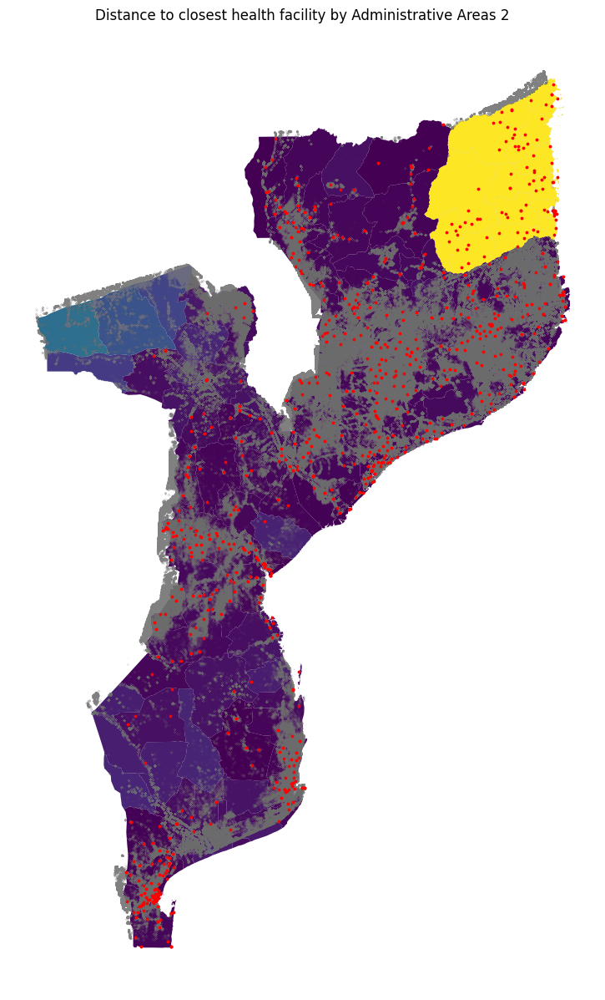

In [48]:
fig, ax = plt.subplots(figsize=(15,15))
    

#add base map
base = gpd_distances_admin_2.plot(ax=ax, 
                         column= 'distance_closest_health_facility', #color scale
                         facecolor='Grey', 
                         edgecolor='k', #black
                         alpha= 1, #no transparency
                         linewidth=0.01)


#plot buildings
plt.scatter(x=df_buildings_pd['longitude'], 
            y= df_buildings_pd['latitude'],
            s=0.001,
            color='grey')

#plot health facilities
plt.scatter(x=df_health_na['longitude'], 
            y= df_health_na['latitude'],
            s=3,
            color='red')


plt.axis('off')
plt.title('Distance to closest health facility by Administrative Areas 2')

It is hard to tell any particular pattern with this level of granularity.<br>
Plot the same variables but with administrative areas 1

### Visualy by administrative areas 1

C:\Users\Utilizador\AppData\Roaming\Python\Python39\site-packages\geopandas\plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


Text(0.5, 1.0, 'Distance to closest health facility by Administrative Areas 1')

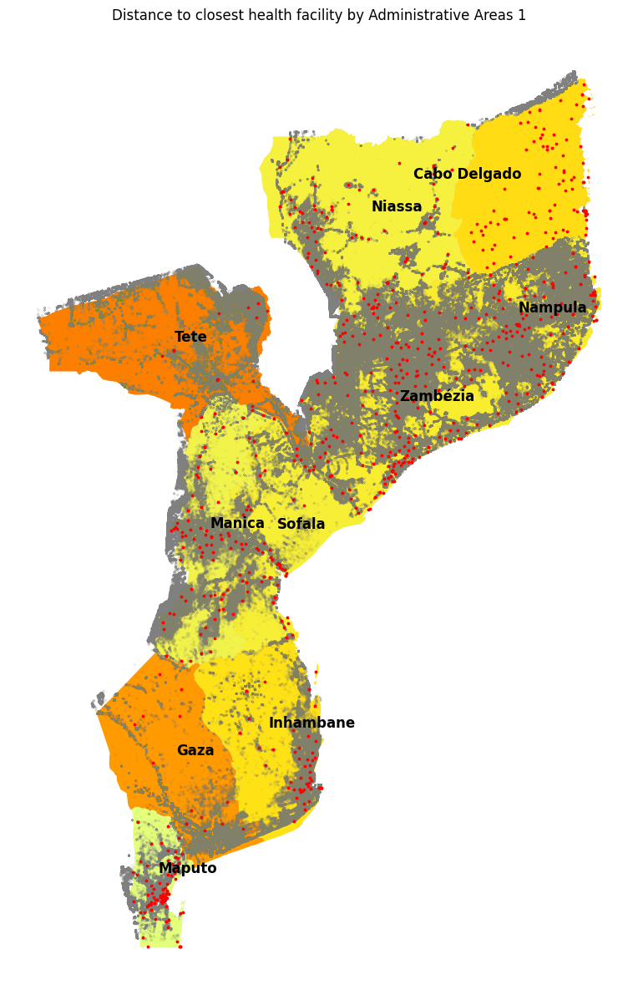

In [49]:
fig, ax = plt.subplots(figsize=(15,15))


# create centroids for region labels

df_boundaries_admin_1_final["center"] = df_boundaries_admin_1_final["geometry"].centroid
gpd_distances_region_points = df_boundaries_admin_1_final.copy()
gpd_distances_region_points.set_geometry("center", inplace = True)

texts = []

for x, y, label in zip(gpd_distances_region_points.geometry.x, 
                       gpd_distances_region_points.geometry.y, 
                       gpd_distances_region_points["region"]):
    
    texts.append(plt.text(x, y, label, 
                          fontsize = 12,
                          fontweight='bold', color='black'))
    

#add base map
gpd_distances_admin_1.plot(ax=ax, 
                         column= 'distance_closest_health_facility', #color scale
                         facecolor='Grey', 
                         edgecolor='k', #black
                         alpha= 1, #no transparency
                         linewidth=0.01,
                         cmap="Wistia")


#add texts   
aT.adjust_text(texts)


#plot buildings
plt.scatter(x=df_buildings_pd['longitude'], 
            y= df_buildings_pd['latitude'],
            s=0.001,
            color='grey')

#plot health facilities
plt.scatter(x=df_health_na['longitude'], 
            y= df_health_na['latitude'],
            s=3,
            color='red')


plt.axis('off')
plt.title('Distance to closest health facility by Administrative Areas 1')


Recalling average distances

In [50]:
distances_admin_1

region
Cabo Delgado    12.341089
Gaza            25.073721
Inhambane       11.443104
Manica           6.990315
Maputo           3.554865
Nampula          9.178289
Niassa           7.874861
Sofala           8.456796
Tete            30.910705
Zambézia         8.921390
Name: distance_closest_health_facility, dtype: float64

Gaza, Cabo Delgado and Tete are the ones in greater need of more health facilities closer to the population. <br>
Gaza and Tete look like it simply do not have enough health facilities for the population density they have.<br>
While Cabo Delgado looks very scarce in population it is probably due to the geography of the area and the type of infrastructure that is hard to detect in our dataset. However, it appears it has a high number of health facilities, so the visual analysis could be misleading given the possible incrrect population density detected.
                                                                                                               